<a href="https://colab.research.google.com/github/Gabriellemga/Python_Data_Science_Alura/blob/main/Geopandas/Geopandas_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MAPAS INTERATIVOS

# 01- Preparação dos dados

In [ ]:
#Instalação da biblioteca folium
! pip install folium -q

In [ ]:
# Instalação da biblioteca geopandas
! pip install geopandas -q

In [ ]:
# Importação das bibliotecas
import pandas as pd
import geopandas as gpd

import os
import zipfile
import shutil
import folium

In [ ]:
# Criação de um diretório temporário
dir = '/content/drive/MyDrive/Geopandas/RJ-SETOR/01.Dados/Mapas/RJ-SETOR/TEMP'
if not os.path.exists(dir):
    os.makedirs(dir)

In [ ]:
# Obtenção dos nomes dos arquivos no diretório dados
filenames = []
for root, dirs, files in os.walk('/content/drive/MyDrive/Geopandas/RJ-SETOR/01.Dados/Mapas/RJ-SETOR/DADOS'):
      filenames = files
filenames

['33045570536.zip',
 '33045570535.zip',
 '33045570538.zip',
 '33045570534.zip',
 '33045570532.zip',
 '33045570539.zip',
 '33045570533.zip',
 '33045570537.zip',
 '33045570530.zip',
 '33045570520.zip',
 '33045570519.zip',
 '33045570531.zip',
 '33045570528.zip',
 '33045570524.zip',
 '33045570527.zip',
 '33045570526.zip',
 '33045570522.zip',
 '33045570525.zip',
 '33045570521.zip',
 '33045570529.zip',
 '33045570523.zip',
 '33045570514.zip',
 '33045570512.zip',
 '33045570517.zip',
 '33045570513.zip',
 '33045570511.zip',
 '33045570506.zip',
 '33045570509.zip',
 '33045570510.zip',
 '33045570508.zip',
 '33045570516.zip',
 '33045570515.zip',
 '33045570507.zip']

In [ ]:
# Extração dos arquivos zip
for item in filenames:
    zip_ref = zipfile.ZipFile("/content/drive/MyDrive/Geopandas/RJ-SETOR/01.Dados/Mapas/RJ-SETOR/DADOS/" + item, 'r')
    zip_ref.extractall(dir)
    zip_ref.close()

In [ ]:
  # Preparando os arquivos

arquivos = [gpd.read_file('/content/drive/MyDrive/Geopandas/RJ-SETOR/01.Dados/Mapas/RJ-SETOR/TEMP/' + item[:-4] + '_setor.shp') for item in filenames]

In [ ]:
# Concatenando os shapefiles
setor = pd.concat(arquivos)

In [ ]:
setor.crs

<Geographic 2D CRS: EPSG:4674>
Name: SIRGAS 2000
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Latin America - Central America and South America - onshore and offshore. Brazil - onshore and offshore.
- bounds: (-122.19, -59.87, -25.28, 32.72)
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [ ]:
setor = setor.to_crs(epsg = 31983)

In [ ]:
setor.crs

<Projected CRS: EPSG:31983>
Name: SIRGAS 2000 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - between 48°W and 42°W, northern and southern hemispheres, onshore and offshore.
- bounds: (-48.0, -33.5, -42.0, 5.13)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<Axes: >

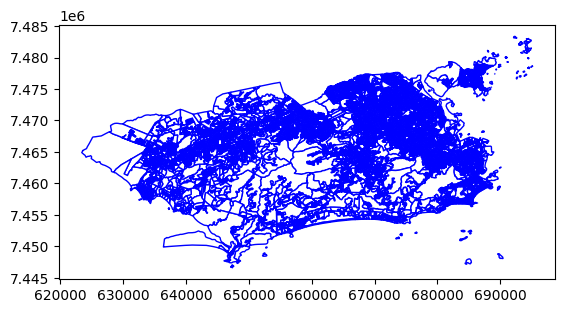

In [ ]:
setor.plot(color = 'white', edgecolor = 'blue')

# 02-Dados censitários

In [ ]:
#Lendo os setores censitários
censo = pd.read_csv('https://docs.google.com/spreadsheets/d/1dj0f2xMlz1denD3flAeJ-pTpGrNeY_jNDVUBfCV1pgo/gviz/tq?tqx=out:csv&sheet')
censo.head()

,Cod_setor,Cod_Grandes Regiões,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,330010005000001,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,...,"2,62","1,94","2356,8","5716056,06","2571,06","5684616,94","1565,37","4344465,56","2192,65","4711305,89"
1,330010005000002,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,...,"2,51","1,5","2040,47","3020377,79","2236,67","2869054,77","1816,69","20052928,88","2375,67","24942113,99"
2,330010005000003,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,...,"3,08","2,19","2687,8","8362007,52","2836,66","8402987,99","1593,37","7250920,66","2294,84","8835722,1"
3,330010005000004,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,...,"3,04","3,25","3026,67","24807309,86","3352,62","26410753,99","1865,52","10994097,59","2574,41","13362652,63"
4,330010005000005,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,...,"3,34","1,94","1124,82","712447,24","1229,19","649944,69","689,4","583588,5","1028,21","521878,03"


In [ ]:
setor.head()

,ID1,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODD,NM_DISTRIT,CD_GEOCODS,NM_SUBDIST,CD_GEOCODM,NM_MUNICIP,NM_MESO,NM_MICRO,geometry
0,408818,330455705360013,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((680006.023 7471420.079, 680009.078 7..."
1,408819,330455705360014,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((679905.943 7471694.676, 679908.544 7..."
2,408820,330455705360015,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((680246.86 7471522.367, 680299.546 74..."
3,408821,330455705360016,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((680115.961 7471561.153, 680106.812 7..."
4,408822,330455705360017,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((680090.418 7471557.009, 680115.137 7..."


In [ ]:
# Modificando o tipo da coluna Cod_setor

censo['Cod_setor'] = censo['Cod_setor'].astype(str)

In [ ]:
# Mesclando seetor e censo

setor = pd.merge(setor, censo, left_on='CD_GEOCODI', right_on='Cod_setor', how='left')

In [ ]:
setor.crs

<Projected CRS: EPSG:31983>
Name: SIRGAS 2000 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - between 48°W and 42°W, northern and southern hemispheres, onshore and offshore.
- bounds: (-48.0, -33.5, -42.0, 5.13)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

## Juntando dados ao dataset do projeto

In [ ]:
# Lendo os geo_dados

geo_dados = gpd.read_file('/content/drive/MyDrive/Geopandas/Geopandas/01.Dados/Mapas/RJ-DATASET/DATASET.shp')
geo_dados.head()

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor,Dist_Metro,Dist_Trans,Dist_Praia,geometry
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000,15.622939,0.443193,1.143453,POINT (657.514 7453.832)
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000,7.530741,3.642787,7.478698,POINT (670.524 7461.803)
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000,0.736973,0.641470,6.240694,POINT (674.345 7469.44)
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000,10.718039,0.422370,3.404589,POINT (662.701 7457.284)
4,260,Recreio dos Bandeirantes,Rio de Janeiro,Rua Desembargador Paulo Alonso,RJ,-23.018927,-43.477505,3,1,2,Apartamento,Venda,1160000,17.131159,0.214605,1.369015,POINT (656.019 7453.574)


In [ ]:
setor.head()

,ID1,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODD,NM_DISTRIT,CD_GEOCODS,NM_SUBDIST,CD_GEOCODM,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,408818,330455705360013,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,...,"3,51","3,6","613,89","254801,54","795,26","185050,33","402,45","259450,55","723,48","234005,59"
1,408819,330455705360014,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,...,"3,29","2,65","985,4","1695778,62","1504,04","1810260,21","828,32","1265806,22","1462,78","1307582,39"
2,408820,330455705360015,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,...,"3,15","3,4","629,37","184971,48","712,89","149811,15","429,44","181741,04","670,19","122130,33"
3,408821,330455705360016,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,...,"3,33","3,35","776,04","525026,25","807,81","520831,86","444,71","360033,9","725,33","383763,59"
4,408822,330455705360017,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,...,"3,02","2,21","617,27","145150,53","714,74","97144,52","416,55","173554,98","688,47","98599,04"


In [ ]:
geo_dados = geo_dados.to_crs(epsg = 31983)

<Axes: >

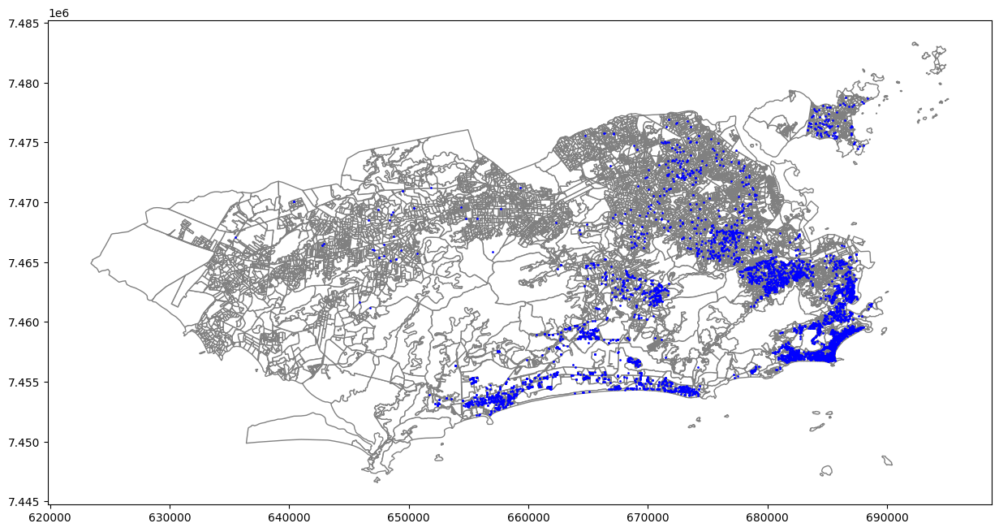

In [ ]:
# Plotando mapa

base = setor.plot(color='white', edgecolor='grey', figsize=(15,8))
geo_dados.plot(ax = base, color='blue', markersize=1)

In [ ]:
# Mesclando geo_dados e setor

geo_dados = gpd.sjoin(geo_dados, setor, how='left', predicate='within')

In [ ]:
geo_dados.shape

(4516, 64)

In [ ]:
# Removendo dados duplicados

geo_dados = geo_dados[~geo_dados.index.duplicated(keep='first')]
geo_dados.shape

(4513, 64)

In [ ]:
geo_dados.crs

<Projected CRS: EPSG:31983>
Name: SIRGAS 2000 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - between 48°W and 42°W, northern and southern hemispheres, onshore and offshore.
- bounds: (-48.0, -33.5, -42.0, 5.13)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

# 03- Agregando regiões geográficas


In [ ]:
setor.head()

,ID1,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODD,NM_DISTRIT,CD_GEOCODS,NM_SUBDIST,CD_GEOCODM,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,408818,330455705360013,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,...,"3,51","3,6","613,89","254801,54","795,26","185050,33","402,45","259450,55","723,48","234005,59"
1,408819,330455705360014,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,...,"3,29","2,65","985,4","1695778,62","1504,04","1810260,21","828,32","1265806,22","1462,78","1307582,39"
2,408820,330455705360015,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,...,"3,15","3,4","629,37","184971,48","712,89","149811,15","429,44","181741,04","670,19","122130,33"
3,408821,330455705360016,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,...,"3,33","3,35","776,04","525026,25","807,81","520831,86","444,71","360033,9","725,33","383763,59"
4,408822,330455705360017,URBANO,330455705158,Maré,330455705,RIO DE JANEIRO,330455705,MARÉ,3304557,...,"3,02","2,21","617,27","145150,53","714,74","97144,52","416,55","173554,98","688,47","98599,04"


In [ ]:
#Filtando as colunas
setor = setor.to_crs(epsg = 4326)
setor_m = setor[['NM_BAIRRO', 'geometry']]

In [ ]:
#Agregando por bairro
bairro = setor_m.dissolve(by='NM_BAIRRO')
bairro

,geometry
NM_BAIRRO,
Abolição,"POLYGON ((-43.30071 -22.89112, -43.30094 -22.8..."
Acari,"POLYGON ((-43.34222 -22.82782, -43.34253 -22.8..."
Alto da Boa Vista,"POLYGON ((-43.29408 -22.97996, -43.29412 -22.9..."
Anchieta,"POLYGON ((-43.41149 -22.83311, -43.41164 -22.8..."
Andaraí,"POLYGON ((-43.25443 -22.93426, -43.25443 -22.9..."
...,...
Vila Valqueire,"POLYGON ((-43.36708 -22.89711, -43.36718 -22.8..."
Vila da Penha,"POLYGON ((-43.31466 -22.84846, -43.31551 -22.8..."
Vista Alegre,"POLYGON ((-43.31923 -22.83183, -43.31931 -22.8..."


<Axes: >

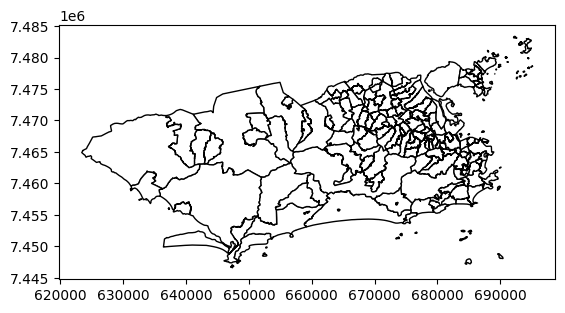

In [ ]:
#Plot do mapa

bairro.plot( color='white', edgecolor = 'black', markersize=1)

In [ ]:
setor_m = setor[['NM_BAIRRO', 'geometry', 'V002']]

In [ ]:
bairro = setor_m.dissolve(by='NM_BAIRRO', aggfunc='sum')
bairro

,geometry,V002
NM_BAIRRO,,
Abolição,"POLYGON ((-43.30071 -22.89112, -43.30094 -22.8...",11356.0
Acari,"POLYGON ((-43.34222 -22.82782, -43.34253 -22.8...",26967.0
Alto da Boa Vista,"POLYGON ((-43.29408 -22.97996, -43.29412 -22.9...",9189.0
Anchieta,"POLYGON ((-43.41149 -22.83311, -43.41164 -22.8...",55634.0
Andaraí,"POLYGON ((-43.25443 -22.93426, -43.25443 -22.9...",39325.0
...,...,...
Vila Valqueire,"POLYGON ((-43.36708 -22.89711, -43.36718 -22.8...",32232.0
Vila da Penha,"POLYGON ((-43.31466 -22.84846, -43.31551 -22.8...",25462.0
Vista Alegre,"POLYGON ((-43.31923 -22.83183, -43.31931 -22.8...",8622.0


In [ ]:
setor_m['V002'].sum()

np.float64(6283486.0)

In [ ]:
bairro['V002'].sum()

np.float64(6283486.0)

In [ ]:
bairro = bairro.to_crs(epsg = 31986)

In [ ]:
bairro.reset_index(inplace=True, drop=False)
bairro

,NM_BAIRRO,geometry,V002
0,Abolição,"POLYGON ((4569392.531 -3110894.453, 4569360.75...",11356.0
1,Acari,"POLYGON ((4566896.792 -3101278.621, 4566856.69...",26967.0
2,Alto da Boa Vista,"POLYGON ((4566735.384 -3122538.515, 4566731.93...",9189.0
3,Anchieta,"POLYGON ((4558449.524 -3099486.115, 4558435.01...",55634.0
4,Andaraí,"POLYGON ((4573226.217 -3118096.913, 4573225.37...",39325.0
...,...,...,...
155,Vila Valqueire,"POLYGON ((4561266.233 -3109285.803, 4561252.44...",32232.0
156,Vila da Penha,"POLYGON ((4569381.51 -3104915.846, 4569262.645...",25462.0
157,Vista Alegre,"POLYGON ((4569479.368 -3102616.001, 4569498.94...",8622.0
158,Zumbi,"POLYGON ((4586913.21 -3106723.398, 4586909.749...",2016.0


# 04-Visualizações com Folium

In [ ]:
#Lendo shapefile
rj = gpd.read_file('/content/drive/MyDrive/Geopandas/Geopandas/01.Dados/Mapas/RJ-MUNIC/RJ-MUNIC.shp')

In [ ]:
#Conferindo crs do rj
rj.crs

<Projected CRS: PROJCS["UTM_Zone_23_Southern_Hemisphere",GEOGCS["G ...>
Name: UTM_Zone_23_Southern_Hemisphere
Axis Info [cartesian]:
- [east]: Easting (kilometre)
- [north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: unknown
- Ellipsoid: GRS80
- Prime Meridian: Greenwich

In [ ]:
rj = rj.to_crs(epsg = 4326)

In [ ]:
rj.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
# Calculando o centroide
y= rj.centroid.y.iloc[0]

x= rj.centroid.x.iloc[0]

/tmp/ipython-input-994998243.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  y= rj.centroid.y.iloc[0]
/tmp/ipython-input-994998243.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  x= rj.centroid.x.iloc[0]


In [ ]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
folium.GeoJson(rj).add_to(base)
base

In [ ]:
 base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
 geojson_rj = folium.GeoJson(rj)
 geojson_rj.add_child(folium.Popup(rj.NM_MUNICIP.iloc[0]))
 geojson_rj.add_to(base)
 base

## Trabalhando com camadas

In [ ]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')

for i in range(len(bairro)):
  geo = folium.GeoJson(bairro[i: i + 1])
  label = '{} - {} habitantes'.format(bairro['NM_BAIRRO'][i], bairro['V002'][i])
  folium.Popup(label).add_to(geo)
  geo.add_to(base)

folium.LayerControl().add_to(base)
base

##  Usando marcadores

In [ ]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
folium.GeoJson(
    rj,
    name='Rio de Janeiro',
    style_function=lambda x: {
        'color': 'Black',
        'weight': 3,
        'fillOpacity': 0
    }
).add_to(base)


amostra = geo_dados.sample(500)
for item in amostra.itertuples():
  base.add_child(folium.Marker(location=[item.Latitude, item.Longitude],
                             popup="<h4>"+str(item.Tipo)+"</h4>" "<h5>"+str(item.Bairro)+"</h5>" "<p>R$"+str(item.Valor)+",00</p>",
                                                         icon=folium.Icon(color='red',
                                             prefix='fa',
                                             icon='fas fa-home')))

folium.LayerControl().add_to(base)
base

##  Marcadores clusterizados

In [ ]:
from folium.plugins import MarkerCluster

In [ ]:
base = folium.Map([y, x], zoom_start=11, tiles='OpenStreetMap')
folium.GeoJson(
    rj,
    name='Rio de Janeiro',
    style_function=lambda x: {
        'color': 'Black',
        'weight': 3,
        'fillOpacity': 0
    }
).add_to(base)

cluster = MarkerCluster()


for item in geo_dados.itertuples():
  cluster.add_child(folium.Marker(location=[item.Latitude, item.Longitude],
                             popup="<h4>"+str(item.Tipo)+"</h4>" "<h5>"+str(item.Bairro)+"</h5>" "<p>R$"+str(item.Valor)+",00</p>",
                                                         icon=folium.Icon(color='red',
                                             prefix='fa',
                                             icon='fas fa-home')))
base.add_child(cluster)
folium.LayerControl().add_to(base)
base

##  Gerando mapas de calor

In [ ]:
y = rj.centroid.y.iloc[0]
x = rj.centroid.x.iloc[0]

/tmp/ipython-input-3673420610.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  y = rj.centroid.y.iloc[0]
/tmp/ipython-input-3673420610.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  x = rj.centroid.x.iloc[0]


In [ ]:
setor = setor.fillna(0)

In [ ]:
data = []
for i in range (len(setor)):
    data.append([setor['geometry'][i].centroid.y,
                 setor['geometry'][i].centroid.x,
                                 setor['V002'][i]/setor['V002'].max()])

In [ ]:
from folium.plugins import HeatMap

In [ ]:
base = folium.Map([y, x], zoom_start=11)

HeatMap(data, name = 'População').add_to(base)
folium.LayerControl().add_to(base)
base
